# Homework 5: Local Feature Matching


# Overview

The goal of this assignment is to create a local feature matching pipeline that consists of three steps: keypoint detection, feature extraction, and matching.

Along with this guided notebook, we have provided you with a few image pairs for which we will implement our local feature matching pipeline.

Let's get started..

# Implementation Process

**1. Keypoints detection**
*   Convert both of the image pairs to grayscale. This will result in faster processing.
*   Compute x and y derivative images.
*   Compute the second moment matrix M, using x and y derivative images. 
*  Compute harris reponse at each pixel location.
*  Perform Non Maximal Supression (NMS), which supresses connected peaks in the harris response image.


**2. Feature Descriptor Computation**


*   After computing the keypoints in an image, the next step is to define features for each of the keypoints. This can be done in various ways. In this assignment, we simply take RGB values around the detected keypoints.

**3. Feature Descriptor Matching**


*   There are several ways of matching feature descriptors between images. In this assignment, we will use a very simple brute force technique using euclidean distance between all pairs of feature descriptors.

**Note**: Unless specified, do not use additional packages or built-in functions.

In [70]:
# Importing Packages
import numpy as np
from imageio.v2 import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
from skimage import feature
from skimage.feature.peak import _prominent_peaks
import pandas as pd
%matplotlib inline

# Some helper functions

In [71]:
# # Plotting matches
# def show_matches(img1, img2, keypoints1, keypoints2):
#   fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 12))
#   match_idx = np.c_[np.arange(keypoints1.shape[0]), np.arange(keypoints2.shape[0])]
#   feature.plot_matches(ax, img1, img2, np.c_[keypoints1[:, 1], keypoints1[:, 0]], np.c_[keypoints2[:, 1], keypoints2[:, 0]], match_idx)

def show_matches(img1, img2, keypoints1, keypoints2):
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 12))
  match_idx = np.c_[np.arange(keypoints1.shape[0]), np.arange(keypoints2.shape[0])]
  feature.plot_matched_features(img1, img2, keypoints0=np.c_[keypoints1[:, 1], keypoints1[:, 0]], keypoints1=np.c_[keypoints2[:, 1], keypoints2[:, 0]], matches=match_idx, ax=ax)

In [72]:
# Plotting images
def plot_img(img, ax, title, cmap='gray'):
  ax.imshow(img, cmap=cmap)
  ax.axis('off')
  ax.set_title(title)

In [73]:
# Convolution Operation for grayscale images
def convolve(img, kernel):
  convolved_img = np.zeros((img.shape[0], img.shape[1]))
  ksize = kernel.shape[0]
  pad_img = np.pad(img, ((ksize//2, ksize//2), (ksize//2, ksize//2)), constant_values=((0, 0), (0, 0)))
  for i in range(ksize//2, ksize//2+img.shape[0]):
    for j in range(ksize//2, ksize//2+img.shape[1]):
      convolved_img[i-ksize//2, j-ksize//2] = np.sum(np.multiply(pad_img[i-ksize//2:i+ksize//2+1, j-ksize//2:j+ksize//2+1], kernel))
  return convolved_img

In [74]:
# Converting an RGB image to grayscale
def get_grayscale_img(img):
  grayscale_img = 0.2989 * img[:, :, 0] + 0.5870 * img[:, :, 1] + 0.1140 * img[:, :, 2]
  return grayscale_img

## In the following section, we will implement the **Harris Corner Detector** algorithm on a simple binary chessboard image, to make sure everything works fine, before moving to complex images

## First, let's define some global variables that will be used in our pipelines

In [75]:
gaussian_kernel_size = 3
gaussian_kernel_sigma = 1
harris_alpha = 0.06                  # Used in Harris Corner response function
harris_window_size = 3               # Window size for gaussian window used in computation of second moment matrix
harris_threshold = 0.8               # Harris threshold for non-maximum suppression
nms_min_distance = 5                 # distance parameter for non-maximum suppression
feature_descriptor_patch_size = 3    # size of window around the detected keypoints to extract features from
topk = 15                            # top k matches selected for demonstrating local feature matching

### First step is to load the image and converting it to grayscale

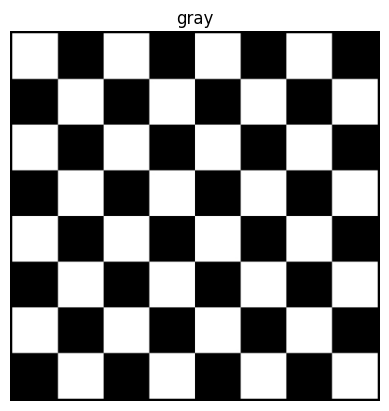

In [76]:
gray = imread("data/chess.jpg") / 255
fig, ax = plt.subplots(1, 1)
plot_img(gray, ax, 'gray')

###Now to compute the x and y derivative images, we will use the derivative of the gaussian filter to reduce effect of noise in image.

$\frac{\partial g}{\partial x} \propto -x e^{-\frac{x^2}{2\sigma^2}} e^{-\frac{y^2}{2\sigma^2}}$

$\frac{\partial g}{\partial y} \propto -y e^{-\frac{x^2}{2\sigma^2}} e^{-\frac{y^2}{2\sigma^2}}$

In [77]:
# Constructing Derivative of Gaussian Kernel in X direction
### Remember to normalize the kernel such that it sums to 1 ###
def get_dx_gaussian_kernel(ksize=3, sigma=1):
  # Code Goes Here:
  ax = np.linspace(-(ksize//2), ksize//2, ksize)
  x, y = np.meshgrid(ax, ax)
  dx_gauss_kernel = -x * np.exp(-(x**2 + y**2) / (2 * sigma**2))
  # dx_gauss_kernel /= np.sum(np.abs(dx_gauss_kernel))
  return dx_gauss_kernel

# Constructing Derivative of Gaussian Kernel in Y direction
def get_dy_gaussian_kernel(ksize=3, sigma=1):
  # Code Goes Here:
  ax = np.linspace(-(ksize//2), ksize//2, ksize)
  x, y = np.meshgrid(ax, ax)
  dy_gauss_kernel = -y * np.exp(-(x**2 + y**2) / (2 * sigma**2))
  # dy_gauss_kernel /= np.sum(np.abs(dy_gauss_kernel))
  #######################################
  return dy_gauss_kernel

**Hint**: Try using lower values of sigma.

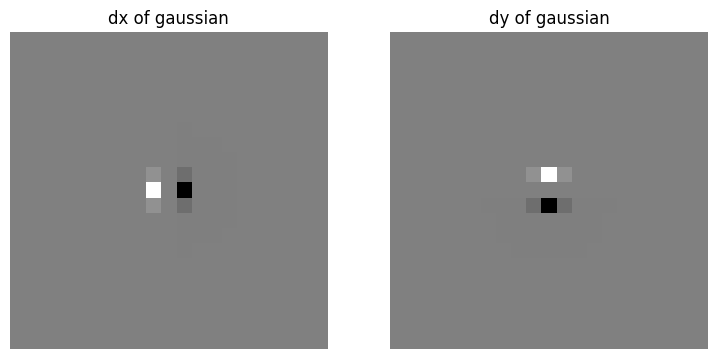

In [78]:
##This just for visualization of derviatives of kernels. 
dx = get_dx_gaussian_kernel(ksize=21, sigma=0.5) #Just for visualization we use large kernel size
dy = get_dy_gaussian_kernel(ksize=21, sigma=0.5)
fig, ax = plt.subplots(1, 2, figsize=(9, 15))
plot_img(dx, ax[0],'dx of gaussian')
plot_img(dy, ax[1], 'dy of gaussian')

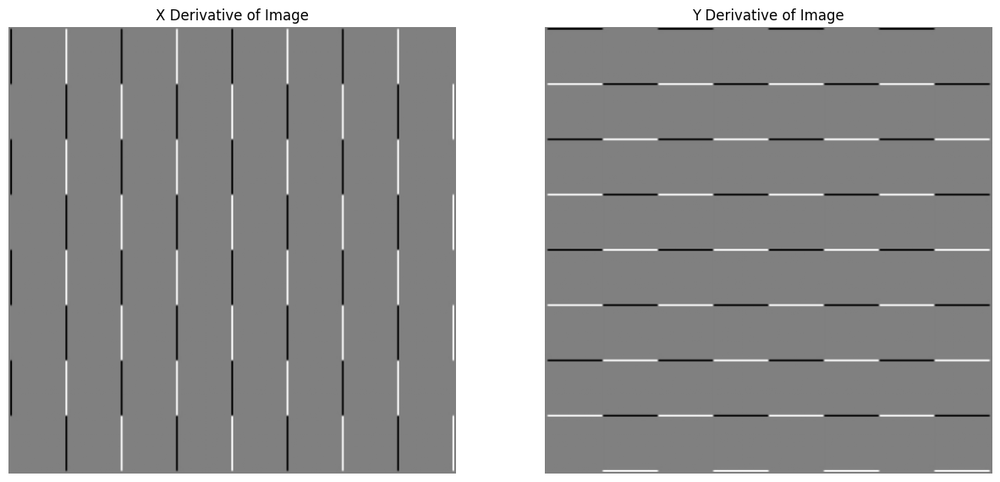

In [79]:
Ix = convolve(gray, get_dx_gaussian_kernel(gaussian_kernel_size, gaussian_kernel_sigma))
Iy = convolve(gray, get_dy_gaussian_kernel(gaussian_kernel_size, gaussian_kernel_sigma))
fig, ax = plt.subplots(1, 2, figsize=(15, 21))
plot_img(Ix, ax[0], 'X Derivative of Image')
plot_img(Iy, ax[1], 'Y Derivative of Image')

### The third step is computing the second moment matrix M  using a window (W) over x and y derivative images. 

\begin{align}
        M = \begin{bmatrix}
        \sum_{x,y}W(x,y)I_{x}^{2} & \sum_{x,y}W(x,y)I_{x} I_{y}\\
        \sum_{x,y}W(x,y)I_{x} I_{y} & \sum_{x,y}W(x,y)I_{y}^{2}
        \end{bmatrix}
    \end{align}

### Then use M to compute harris Corner response function $R$ at each pixel.

\begin{align}
        R = det(M) - \alpha*(trace(M))^2
    \end{align}

In [93]:
def harris_response(Ix, Iy, window_size=3, alpha=0.05):
  # Code Goes Here:
  #   #######################################
  # 1. Compute the second moment matrix, M, using Ixx, Iyy, Ixy and a window (W)
  Ix2 = Ix ** 2
  Iy2 = Iy ** 2
  Ixy = Ix * Iy
  # Generate Gaussian window
  gaussian_window = np.ones((window_size, window_size))
  # gaussian_window /= gaussian_window.sum()
  
  # print(Ix2.shape, Iy2.shape, Ixy.shape, gaussian_window.shape)
  M_xx = convolve(Ix2, gaussian_window)
  M_yy = convolve(Iy2, gaussian_window)
  M_xy = convolve(Ixy, gaussian_window)
  # 2. Compute the harris corner response Image using M
  det = M_xx * M_yy - M_xy**2
  trace = M_xx + M_yy
  R = det - alpha * trace**2
  #######################################
  return R

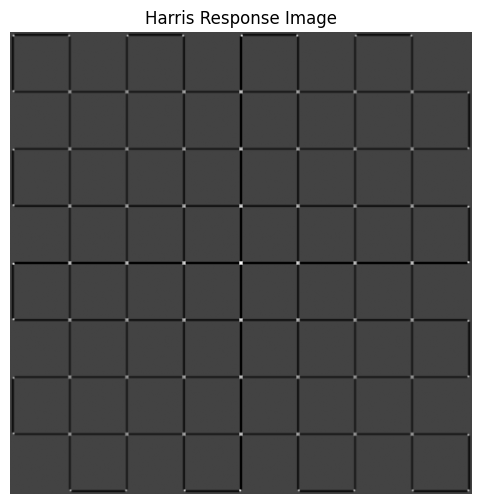

In [94]:
R = harris_response(Ix, Iy, window_size=harris_window_size, alpha=harris_alpha)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plot_img(R, ax, 'Harris Response Image')


In [95]:
R.mean()

np.float64(-0.31184227304084544)

### The last step is Non Maximal Supression (NMS), which supresses connected peaks in the harris response image. We will use a built-in function to acheive this. Have a look at the source code - [`skimage.feature.peak._prominent_peaks`](https://github.com/scikit-image/scikit-image/blob/00177e14097237ef20ed3141ed454bc81b308f82/skimage/feature/peak.py#L329)

In [83]:
# This function returns (row, col) of corners computed from harris response image using NMS
def get_peaks(R, min_distance=5, threshold=1):
  peaks = _prominent_peaks(R, min_xdistance=min_distance, min_ydistance=min_distance, threshold=threshold)
  return peaks

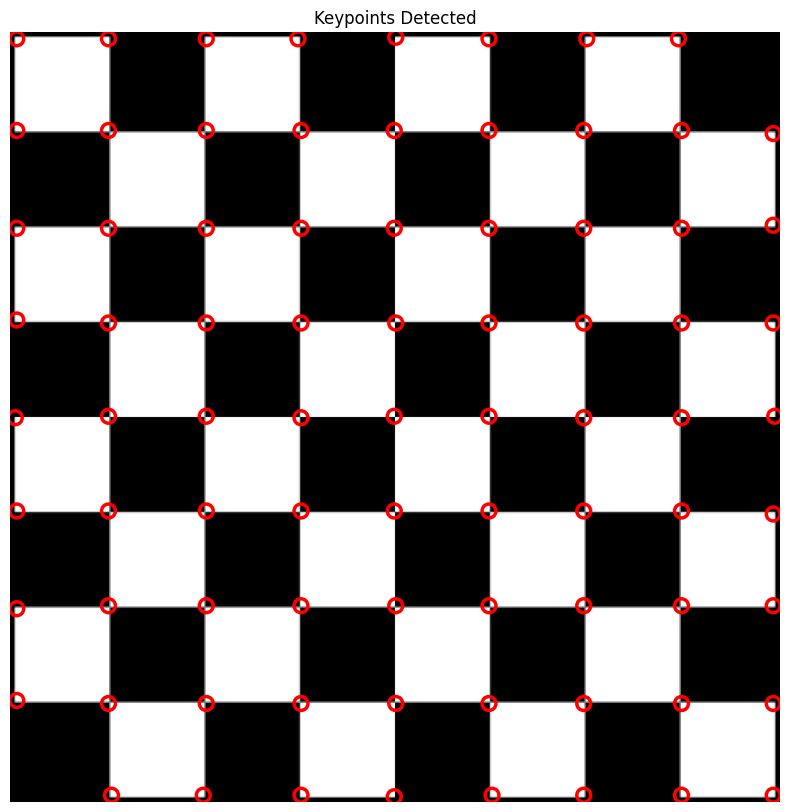

In [96]:
resp, x, y = get_peaks(R, min_distance=nms_min_distance, threshold=harris_threshold) # Play around with parameters
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot_img(gray, ax, 'Keypoints Detected')
ax.scatter(x, y, facecolors='none', color='red', s=100, linewidth=2.5)

## We provided a simple chessboard image to test the implementation of the Harris corner detector. If the implementation is correct, you should be able to see corners detected on the chessboard image.

## Now that your corner detector is fully functional, we package all the steps into a single function pipeline that takes a pair of image and the corner detector related arguments and returns pixel location of detected keypoints for both the images

In [85]:
def detect_keypoints(im1, im2, ksize=3, sigma=1, window_size=3, alpha=0.06, min_distance=5, threshold=1):
  fig, ax = plt.subplots(1, 2)
  plot_img(im1, ax[0],'Im1')
  plot_img(im2, ax[1],'Im2')
  plt.show()

  ## Get derivatives I_x and I_y for image1
  Ix1 = convolve(im1, get_dx_gaussian_kernel(ksize, sigma))
  Iy1 = convolve(im1, get_dy_gaussian_kernel(ksize, sigma))
  fig, ax = plt.subplots(1, 2)
  plot_img(Ix1, ax[0], 'X Derivative of Image 1')
  plot_img(Iy1, ax[1], 'Y Derivative of Image 1')

  plt.show()

  ## Get derivatives I_x and I_y for image2
  Ix2 = convolve(im2, get_dx_gaussian_kernel(ksize, sigma))
  Iy2 = convolve(im2, get_dy_gaussian_kernel(ksize, sigma))
  fig, ax = plt.subplots(1, 2)
  plot_img(Ix2, ax[0], 'X Derivative of Image 2')
  plot_img(Iy2, ax[1], 'Y Derivative of Image 2')
  plt.show()

  ## Obtain harris response function output for both the images
  R1 = harris_response(Ix1, Iy1, window_size=window_size, alpha=alpha)
  R2 = harris_response(Ix2, Iy2, window_size=window_size, alpha=alpha)
  fig, ax = plt.subplots(1, 2)
  plot_img(R1, ax[0], 'Harris Response Image 1')
  plot_img(R2, ax[1], 'Harris Response Image 2')
  plt.show()

  # Perform non-maximum suppression
  _, x1, y1 = get_peaks(R1, min_distance=min_distance, threshold=threshold) # Play aroound with min_distance parameter
  _, x2, y2 = get_peaks(R2, min_distance=min_distance, threshold=threshold) # Play aroound with min_distance parameter
  fig, ax = plt.subplots(1, 2, figsize=(10, 10))
  plot_img(im1, ax[0], 'Keypoints Detected')
  ax[0].scatter(x1, y1, facecolors='none', color='red', s=75, linewidth=2.5)
  plot_img(im2, ax[1], 'Keypoints Detected')
  ax[1].scatter(x2, y2, facecolors='none', color='red', s=75, linewidth=2.5)
  plt.show()
  return x1, y1, x2, y2

## Feature Descriptor Computation

### To extract RGB feature descriptor for all of our detected keypoints, we can adopt following process:

1.   Start with the original RGB image. 
2.   For a given keypoint, define a small window (patch) around it.
3.   Extract the patch as a 3-D matrix (H x W x C).
4.   Convert the 3-D matrix into a column vector.
5.   Repeat steps 2-4 for all the keypoints. 

In [86]:
# This function returns a 2D matrix of shape - N x (HXWXC)
# where N is the number of keypoints given as input and
# HxWXC is the dimensionality of a single descriptor vector.
def get_feature_descriptors(im, keypx, keypy, patch_size=3):
  # Code Goes Here:
  descriptors = []
  h, w = im.shape[:2]
  half = patch_size // 2
  for x, y in zip(keypx, keypy):
      x = int(round(x))
      y = int(round(y))
      x_start = x - half
      x_end = x_start + patch_size
      y_start = y - half
      y_end = y_start + patch_size
      if x_start < 0 or x_end >= w or y_start < 0 or y_end >= h:
          continue
      patch = im[y_start:y_end, x_start:x_end, :]
      descriptors.append(patch.flatten())
      
  feature_descript = np.array(descriptors)
  return feature_descript

## Feature Descriptor Matching

### Now using our extracted feature descriptors for keypoints from both the images, we can adopt a very simple and brute force technique as follows:

1.    For a given feature descriptor in im1, compute its pairwise 'euclidean' distance with all feature descriptors in im2. 
2.    The given feature descriptor is matched with the feature descriptor with the least euclidean distance.
3.    Repeat steps 1-2 until all feature descriptors in im1 are matched.
4.    Select top k matches which have the least euclidean distances. This is done to ensure we remove incorrect/noisy matches.

In [87]:
# This function returns a kx2 matrix which has matched indexes from im1 and im2.
# Each row is of the form [idx_1, idx_2], where idx_1 is the index of descriptor in im1 and idx_2 is the index of descriptor in im2.
def match_features(descriptor1, descriptor2, topk=10):
  # Code Goes Here:
  if descriptor1.size == 0 or descriptor2.size == 0:
      return np.array([])
  
  dists = np.sqrt(((descriptor1[:, np.newaxis] - descriptor2[np.newaxis, :])**2).sum(axis=2))
  matches = []
  for i in range(dists.shape[0]):
      j = np.argmin(dists[i])
      matches.append([i, j])
  matches = np.array(matches)
  
  if matches.size == 0:
      return matches
  
  match_dists = dists[matches[:, 0], matches[:, 1]]
  sorted_indices = np.argsort(match_dists)
  matched_idx = matches[sorted_indices[:topk]]
  return matched_idx

## Panorama Stitching

One of the cool applications of local feature matching is **Panaroma stitching**. We have provided you a simple affine transformation based approach for panaroma stitching using the results of the local feature mathcing pipeline we developed above. 

In [88]:
def stitch_affine(im1, im2, matches_im1, matches_im2):
  hom_im1 = np.concatenate((matches_im1, np.ones(matches_im1.shape[0]).reshape(-1, 1)), axis=1)
  hom_im2 = np.concatenate((matches_im2, np.ones(matches_im2.shape[0]).reshape(-1, 1)), axis=1)
  M, _, _, _ = np.linalg.lstsq(hom_im1, hom_im2,rcond=None)

  index1 = np.indices((im1.shape[0], im1.shape[1]))
  x1, y1 = index1[1], index1[0]
  index2 = np.indices((im2.shape[0], im2.shape[1]))
  x2, y2 = index2[1], index2[0]
  coors = np.concatenate((x1.reshape(-1, 1), y1.reshape(-1, 1), np.ones(x1.size).reshape(-1, 1)), axis=1)

  transformed = coors @ M
  transformed = transformed.astype(int)
  
  xmax = max(transformed[:, 0].max(), x2.flatten().max())
  xmin = min(transformed[:, 0].min(), x2.flatten().min())
  ymax = max(transformed[:, 1].max(), y2.flatten().max())
  ymin = min(transformed[:, 1].min(), y2.flatten().min())

  pano = np.zeros((ymax-ymin, xmax-xmin, 3))

  im1 = im1.reshape(-1, 3)

  for i in range(im1.shape[0]):
    pano[transformed[i, 1]-ymin-1, transformed[i, 0]-xmin-1] = im1[i, :]

  y2 = y2.flatten()
  x2 = x2.flatten()
  im2 = im2.reshape(-1, 3)

  for i in range(im2.shape[0]):
      pano[y2[i]-ymin-1, x2[i]-xmin-1] = im2[i, :]

  return pano

## Main Pipeline

In [89]:
def local_feature_matcher(im1path, im2path, config):
  im1 = imread(im1path) / 255
  im2 = imread(im2path) / 255
  gray1 = get_grayscale_img(im1)
  gray2 = get_grayscale_img(im2)
  x1, y1, x2, y2 = detect_keypoints(im1=gray1, im2=gray2, ksize =config['gaussian_kernel_size'], sigma= config['gaussian_kernel_sigma'],
                                    alpha = config['harris_alpha'], window_size=config['harris_window_size'], threshold=config['harris_threshold'],
                                    min_distance= config['nms_min_distance'])

  descriptor1 = get_feature_descriptors(im=im1, keypx=x1, keypy=y1, patch_size = config['feature_descriptor_patch_size'])
  descriptor2 = get_feature_descriptors(im=im2, keypx=x2, keypy=y2, patch_size = config['feature_descriptor_patch_size'])

  matched_idx = match_features(descriptor1= descriptor1, descriptor2=descriptor2, topk=config['topk'])

  matches_im1 = np.c_[x1[matched_idx[:, 0]], y1[matched_idx[:, 0]]]
  matches_im2 = np.c_[x2[matched_idx[:, 1]], y2[matched_idx[:, 1]]]

  show_matches(im1, im2, matches_im1, matches_im2)

  pano = stitch_affine(im1, im2, matches_im1, matches_im2)
  fig, ax = plt.subplots(1, 1, figsize=(16, 12))
  plot_img(pano, ax, 'Stitched Image')

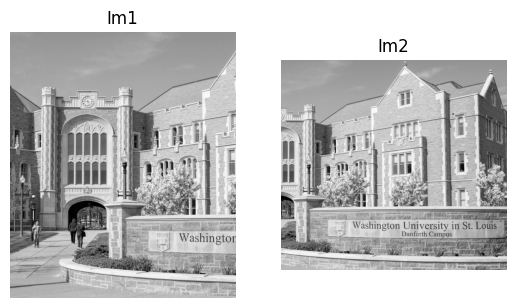

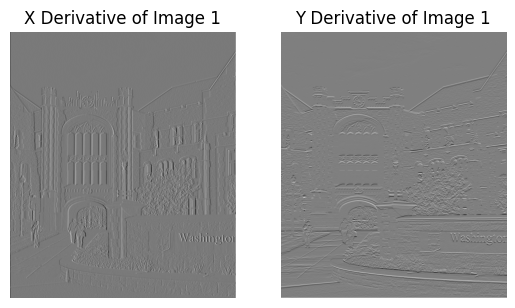

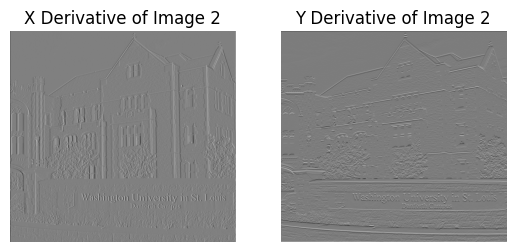

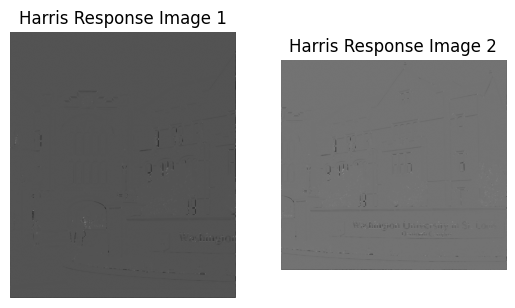

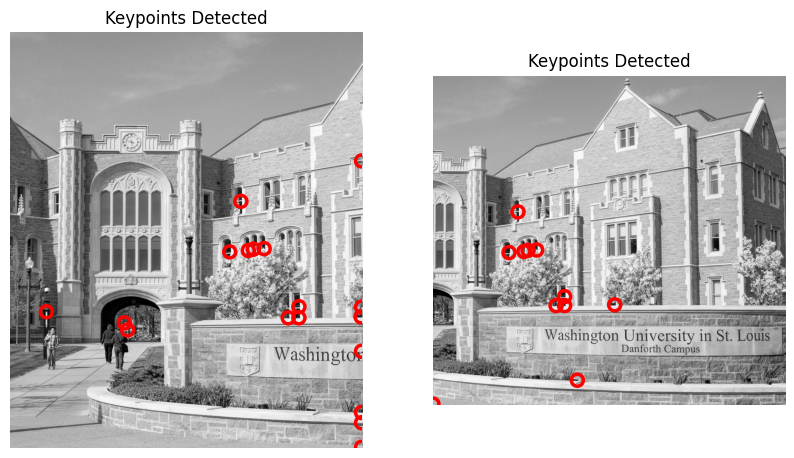

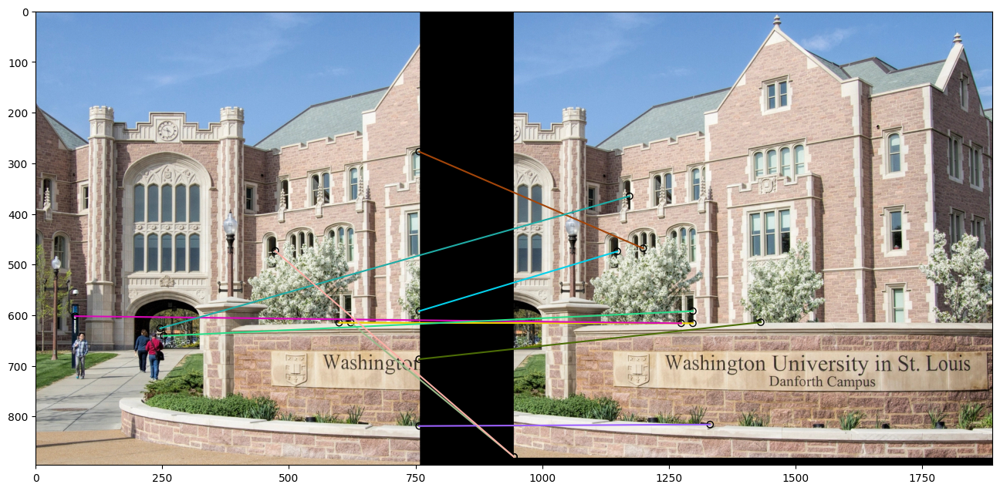

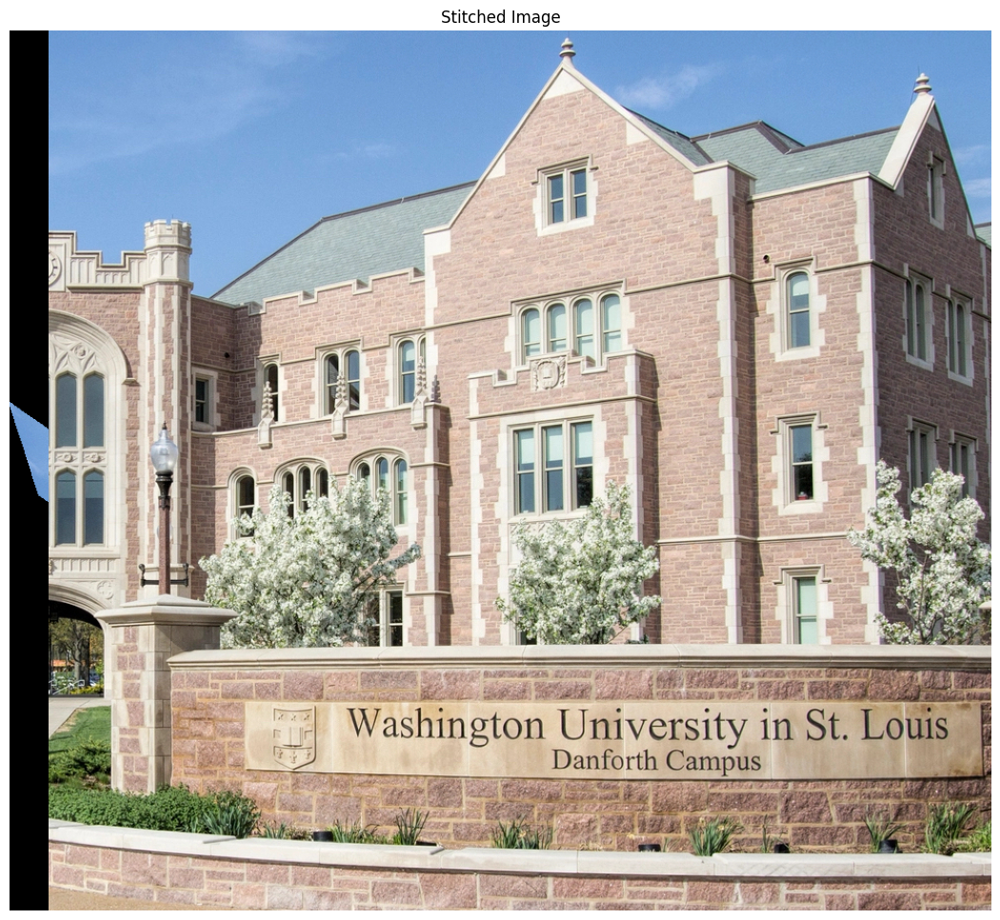

In [90]:
config = {'gaussian_kernel_size':3, 
          'gaussian_kernel_sigma':1.0,
          'harris_alpha' : 0.06,                 # Used in Harris Corner response function
          'harris_window_size': 3,               # Window size for gaussian window used in computation of second moment matrix
          'harris_threshold': 0.5,               # Harris threshold for non-maximum suppression
          'nms_min_distance': 5,                 # distance parameter for non-maximum suppression
          'feature_descriptor_patch_size': 3,    # size of window around the detected keypoints to extract features from
          'topk':10                              # top k matches selected for demonstrating local feature matching
          } 
im1path = "washu_1.jpeg"
im2path = "washu_2.jpeg"

local_feature_matcher(im1path, im2path, config)

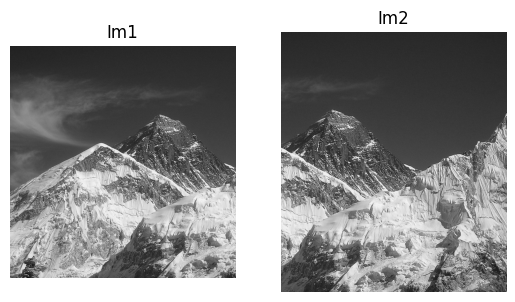

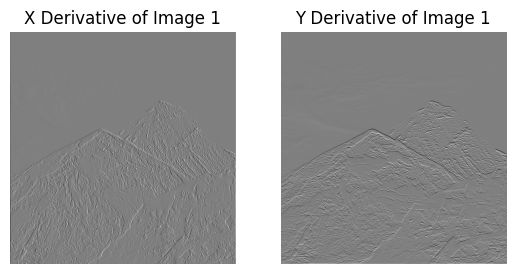

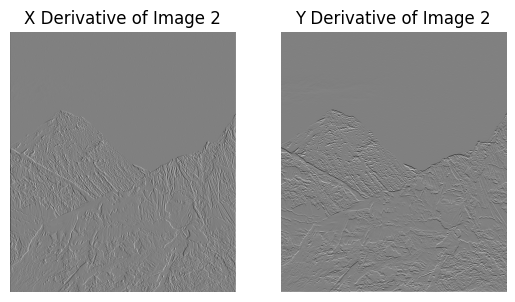

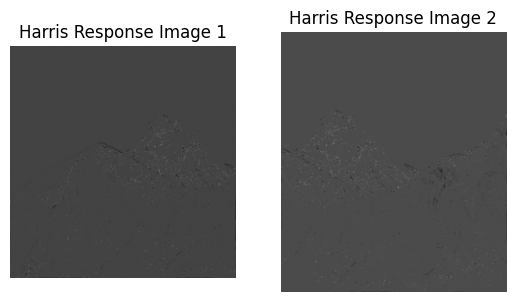

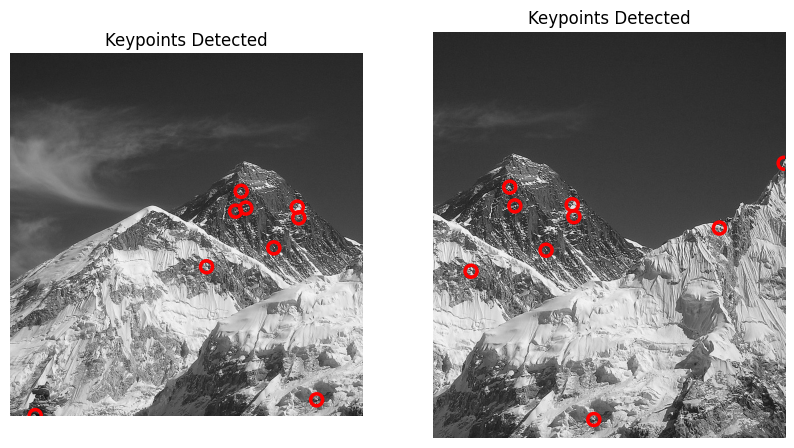

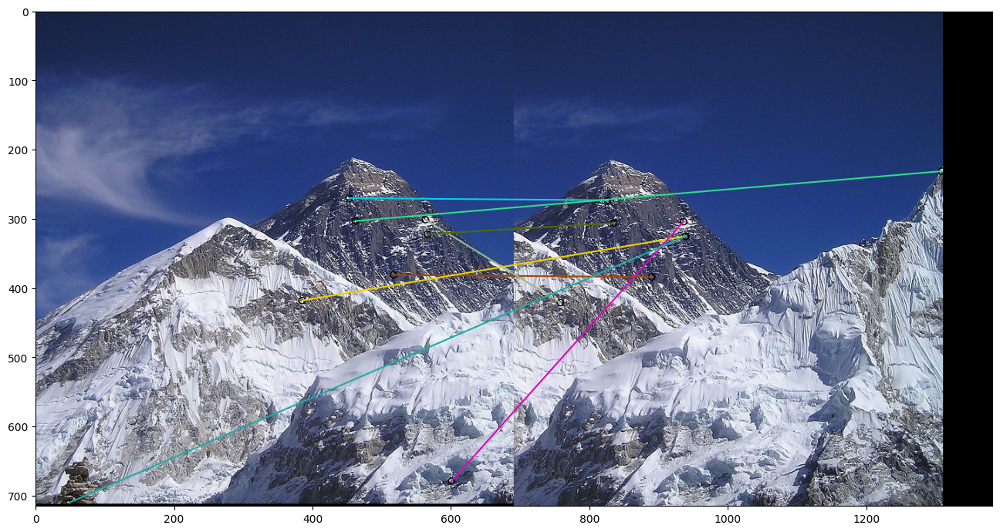

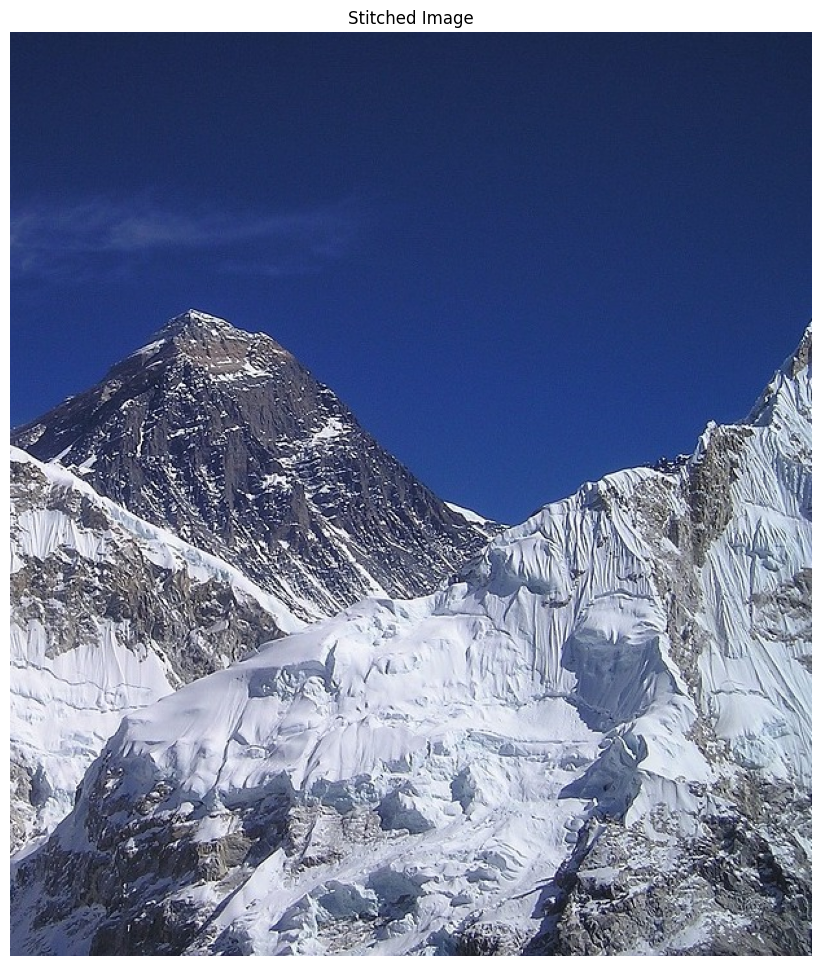

In [91]:
config = {'gaussian_kernel_size':3, 
          'gaussian_kernel_sigma':1.0,
          'harris_alpha' : 0.07,                 # Used in Harris Corner response function
          'harris_window_size': 3,               # Window size for gaussian window used in computation of second moment matrix
          'harris_threshold': 1.0,               # Harris threshold for non-maximum suppression
          'nms_min_distance': 15,                 # distance parameter for non-maximum suppression
          'feature_descriptor_patch_size': 3,    # size of window around the detected keypoints to extract features from
          'topk':10                               # top k matches selected for demonstrating local feature matching
          } 
im1path = "mountEverest_1.jpg"
im2path = "mountEverest_2.jpg"

local_feature_matcher(im1path, im2path,config)

# AI Usage Summary

[as per course policy, we allow the use of AI assistants as part of completing homework assignments, however such usage must be acknowledged. If it is detected and not acknowledged, it will be considered a violation of academic integrity. As such, please summarize what AI tools you used to complete this assignment, including for understanding the concepts and generating source code. If you used code generation, please explain the extent to which you had to modify the solution for it to function correctly.]

# Credits
Assignment developed by Nathan Jacobs.